In [ ]:
import os
print(os.listdir('/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/'))


In [ ]:
import yaml

yaml_path = '/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/visdrone.yaml'

with open(yaml_path) as f:
    config = yaml.safe_load(f)

print(config)

In [ ]:
config['path'] = '/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset'

os.makedirs('/kaggle/working/configs', exist_ok=True)
with open('/kaggle/working/configs/visdrone.yaml', 'w') as f:
    yaml.dump(config, f, default_flow_style=False, sort_keys=False)

# Verify
with open('/kaggle/working/configs/visdrone.yaml') as f:
    print(f.read())

In [ ]:
import os
os.makedirs('/kaggle/working/src', exist_ok=True)
os.makedirs('/kaggle/working/configs', exist_ok=True)
print('Directories created')

In [ ]:
%%writefile /kaggle/working/configs/train_config.yaml
model: yolov8n.pt
data: /kaggle/working/configs/visdrone.yaml
epochs: 50
imgsz: 1280
batch: 4
device: 0, 1
rect: true
classes:
- 0
- 1
- 3

optimizer: AdamW
lr0: 0.001
lrf: 0.01
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3

mosaic: 1.0
mixup: 0.15
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
fliplr: 0.5
scale: 0.5
translate: 0.1
degrees: 0.0

conf: 0.25
iou: 0.45
max_det: 300

project: /kaggle/working/runs/train
name: yolov8n_visdrone
save: true
save_period: 10
val: true
plots: true

In [ ]:
print(os.listdir('/kaggle/working/configs/'))

In [ ]:
!pip install ultralytics deep-sort-realtime -q

import os, yaml, cv2, shutil, random
import numpy as np
import matplotlib
matplotlib.use('Agg')   # non-interactive backend — required in Kaggle
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import pandas as pd
from pathlib import Path
from collections import Counter, defaultdict, deque
from tqdm import tqdm

# Useful constants
DATA_ROOT = '/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset'
WORK_DIR  = '/kaggle/working'
SRC_DIR   = f'{WORK_DIR}/src'
YAML_PATH = f'{WORK_DIR}/configs/visdrone.yaml'

for d in [SRC_DIR, f'{WORK_DIR}/configs',
          f'{WORK_DIR}/outputs/visualizations',
          f'{WORK_DIR}/outputs/predictions',
          f'{WORK_DIR}/outputs/tracking']:
    os.makedirs(d, exist_ok=True)

print('All directories created.')

In [ ]:
%%writefile /kaggle/working/src/dataset.py
"""
Task 01: Dataset Understanding & Preprocessing
================================================
Generates dataset statistics and visualizations.
Kaggle-adapted: no plt.show(), paths use DATA_ROOT env var or argument.
"""

import os, cv2, random
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import pandas as pd
from pathlib import Path
from collections import Counter
from tqdm import tqdm

HUMAN_CLASSES = {0, 1}
CAR_CLASSES   = {3}
CLASS_NAMES   = {
    0: "pedestrian", 1: "people", 2: "bicycle", 3: "car",
    4: "van", 5: "truck", 6: "tricycle", 7: "awning-tricycle",
    8: "bus", 9: "motor"
}

# ── Stats ──────────────────────────────────────────────────────────────────

def compute_dataset_stats(src_root: str, split: str = "train") -> pd.DataFrame:
    split_map = {
        "train": "VisDrone2019-DET-train",
        "val":   "VisDrone2019-DET-val",
    }
    folder  = split_map[split]
    img_dir = Path(src_root) / folder / "images"
    lbl_dir = Path(src_root) / folder / "labels"

    records = []
    for lbl_path in tqdm(sorted(lbl_dir.glob("*.txt")), desc=f"Stats {split}"):
        img_path = img_dir / lbl_path.with_suffix(".jpg").name
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        img_h, img_w = img.shape[:2]

        with open(lbl_path) as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                parts = line.split()
                if len(parts) != 5:
                    continue
                cls_id = int(parts[0])
                cx, cy, nw, nh = map(float, parts[1:])
                pixel_w = nw * img_w
                pixel_h = nh * img_h
                area    = pixel_w * pixel_h
                records.append({
                    "file":       lbl_path.stem,
                    "category":   cls_id,
                    "class_name": CLASS_NAMES.get(cls_id, "unknown"),
                    "cx": cx, "cy": cy,
                    "nw": nw, "nh": nh,
                    "pixel_w": pixel_w,
                    "pixel_h": pixel_h,
                    "area":    area,
                    "aspect":  pixel_w / max(pixel_h, 1),
                    "img_w": img_w, "img_h": img_h,
                    # BUG FIX: add mapped yolo_class (0=human,1=car) used by bbox plot
                    "yolo_class": 0 if cls_id in HUMAN_CLASSES else (1 if cls_id in CAR_CLASSES else -1),
                })
    return pd.DataFrame(records)


# ── Plots ──────────────────────────────────────────────────────────────────

def plot_class_distribution(df: pd.DataFrame, out_path: str = None):
    TARGET_CLASSES = HUMAN_CLASSES | CAR_CLASSES
    target_df = df[df["category"].isin(TARGET_CLASSES)]
    counts = target_df["class_name"].value_counts()

    fig, ax = plt.subplots(figsize=(8, 4))
    colors = ["#00cc66", "#33aaff", "#ff6600"][:len(counts)]
    bars = ax.bar(counts.index, counts.values, color=colors)
    ax.set_title("Annotation Count by Target Class (VisDrone)", fontsize=14, fontweight="bold")
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 200,
                f"{bar.get_height():,}", ha="center", fontsize=10)
    plt.tight_layout()
    if out_path:
        os.makedirs(Path(out_path).parent, exist_ok=True)
        plt.savefig(out_path, dpi=150, bbox_inches="tight")
        print(f"Saved: {out_path}")
    plt.close()


def plot_bbox_size_distribution(df: pd.DataFrame, out_path: str = None):
    """BUG FIX: was referencing non-existent 'yolo_class' column — now added in compute_dataset_stats."""
    TARGET_CLASSES = HUMAN_CLASSES | CAR_CLASSES
    target_df = df[df["category"].isin(TARGET_CLASSES)].copy()

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    labels = {0: "human", 1: "car"}
    colors = {0: "#00cc66", 1: "#3399ff"}

    for ax, cls in zip(axes, [0, 1]):
        sub = target_df[target_df["yolo_class"] == cls]
        if sub.empty:
            ax.set_title(f"No data for {labels[cls]}")
            continue
        ax.hist(np.log1p(sub["area"]), bins=50, color=colors[cls], alpha=0.8, edgecolor="white")
        ax.set_title(f"BBox Area — {labels[cls]}", fontweight="bold")
        ax.set_xlabel("log(1 + area) in pixels²")
        ax.set_ylabel("Count")
        median_val = sub['area'].median()
        ax.axvline(np.log1p(median_val), color="red", linestyle="--",
                   label=f"Median: {median_val:.0f} px²")
        ax.legend()

    plt.suptitle("Small Object Challenge: Most boxes are < 400 px²", fontsize=13, y=1.02)
    plt.tight_layout()
    if out_path:
        os.makedirs(Path(out_path).parent, exist_ok=True)
        plt.savefig(out_path, dpi=150, bbox_inches="tight")
        print(f"Saved: {out_path}")
    plt.close()


def visualize_sample_annotations(src_root: str, split: str = "train",
                                  n: int = 4, out_path: str = None):
    """BUG FIX: rect was added to ax OUTSIDE the for-loop → only last bbox was drawn."""
    split_map = {"train": "VisDrone2019-DET-train", "val": "VisDrone2019-DET-val"}
    folder  = split_map.get(split, "VisDrone2019-DET-train")
    img_dir = Path(src_root) / folder / "images"
    lbl_dir = Path(src_root) / folder / "labels"

    all_imgs = list(img_dir.glob("*.jpg"))
    if not all_imgs:
        print(f"No images found in {img_dir}")
        return

    img_files = random.sample(all_imgs, min(n, len(all_imgs)))
    fig, axes = plt.subplots(1, len(img_files), figsize=(5 * len(img_files), 5))
    if len(img_files) == 1:
        axes = [axes]

    TARGET_CLASSES = HUMAN_CLASSES | CAR_CLASSES

    for ax, img_path in zip(axes, img_files):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_h, img_w = img.shape[:2]

        lbl_path = lbl_dir / img_path.with_suffix(".txt").name
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:                          # BUG FIX: rect inside loop
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split()
                    if len(parts) != 5:
                        continue
                    cls_id = int(parts[0])
                    if cls_id not in TARGET_CLASSES:
                        continue
                    cx, cy, nw, nh = map(float, parts[1:])
                    x1 = int((cx - nw / 2) * img_w)
                    y1 = int((cy - nh / 2) * img_h)
                    x2 = int((cx + nw / 2) * img_w)
                    y2 = int((cy + nh / 2) * img_h)
                    color = [0, 0.9, 0.4] if cls_id in HUMAN_CLASSES else [0.1, 0.4, 1.0]
                    rect = mpatches.Rectangle(
                        (x1, y1), x2 - x1, y2 - y1,
                        linewidth=1.5, edgecolor=color, facecolor="none"
                    )
                    ax.add_patch(rect)   # BUG FIX: was outside loop

        ax.imshow(img)
        ax.set_title(img_path.name[:20], fontsize=9)
        ax.axis("off")

    human_patch = mpatches.Patch(color=[0, 1, 0.4], label="human")
    car_patch   = mpatches.Patch(color=[0, 0.4, 1], label="car")
    fig.legend(handles=[human_patch, car_patch], loc="lower center",
               ncol=2, fontsize=11, frameon=True)
    plt.suptitle("VisDrone Sample Annotations", fontsize=14, fontweight="bold", y=1.02)
    plt.tight_layout()
    if out_path:
        os.makedirs(Path(out_path).parent, exist_ok=True)
        plt.savefig(out_path, dpi=150, bbox_inches="tight")
        print(f"Saved: {out_path}")
    plt.close()



In [ ]:
%%writefile /kaggle/working/src/train.py
"""
Task 02: Model Training
========================
Fine-tunes YOLOv8n on VisDrone (human + car).
Kaggle-adapted: device='0,1' for T4x2, paths point to /kaggle/working.
"""

import os, sys, yaml, argparse
from pathlib import Path


def train(config_path: str = "/kaggle/working/configs/train_config.yaml"):
    try:
        from ultralytics import YOLO
    except ImportError:
        print("ERROR: pip install ultralytics")
        sys.exit(1)

    with open(config_path) as f:
        cfg = yaml.safe_load(f)

    print("=" * 60)
    print("  YOLOv8 Training — VisDrone (Kaggle T4x2)")
    print("=" * 60)
    for key in ["model", "epochs", "imgsz", "batch", "device"]:
        print(f"  {key:<12}: {cfg[key]}")
    print("=" * 60)

    model   = YOLO(cfg["model"])
    results = model.train(
        data          = cfg["data"],
        epochs        = cfg["epochs"],
        imgsz         = cfg["imgsz"],
        batch         = cfg["batch"],
        rect          = cfg["rect"],
        classes       = cfg["classes"],
        device        = cfg["device"],
        optimizer     = cfg["optimizer"],
        lr0           = cfg["lr0"],
        lrf           = cfg["lrf"],
        momentum      = cfg["momentum"],
        weight_decay  = cfg["weight_decay"],
        warmup_epochs = cfg["warmup_epochs"],
        mosaic        = cfg["mosaic"],
        mixup         = cfg["mixup"],
        hsv_h         = cfg["hsv_h"],
        hsv_s         = cfg["hsv_s"],
        hsv_v         = cfg["hsv_v"],
        fliplr        = cfg["fliplr"],
        scale         = cfg["scale"],
        translate     = cfg["translate"],
        conf          = cfg["conf"],
        iou           = cfg["iou"],
        max_det       = cfg["max_det"],
        project       = cfg["project"],
        name          = cfg["name"],
        save          = cfg["save"],
        save_period   = cfg["save_period"],
        val           = cfg["val"],
        plots         = cfg["plots"],
        verbose       = True,
    )
    best = f"{cfg['project']}/{cfg['name']}/weights/best.pt"
    print(f"\nTraining complete!  Best weights: {best}")
    return results


def validate(weights: str,
             data: str  = "/kaggle/working/configs/visdrone.yaml",
             imgsz: int = 1280,
             conf: float = 0.25,
             iou: float  = 0.45):
    from ultralytics import YOLO
    print(f"\nValidating: {weights}")
    model   = YOLO(weights)
    metrics = model.val(data=data, imgsz=imgsz, conf=conf, iou=iou, plots=True)
    print("\n=== Validation Results ===")
    print(f"  mAP@0.5      : {metrics.box.map50:.4f}")
    print(f"  mAP@0.5:0.95 : {metrics.box.map:.4f}")
    print(f"  Precision    : {metrics.box.mp:.4f}")
    print(f"  Recall       : {metrics.box.mr:.4f}")
    class_names = {0: "human", 1: "car"}
    for i, ap in enumerate(metrics.box.maps):
        print(f"  mAP@0.5 [{class_names.get(i, i)}]: {ap:.4f}")
    return metrics


def export_model(weights: str, fmt: str = "onnx"):
    from ultralytics import YOLO
    model = YOLO(weights)
    path  = model.export(format=fmt, imgsz=1280)
    print(f"Exported to: {path}")


if __name__ == "__main__":
    parser = argparse.ArgumentParser()
    parser.add_argument("--config",   default="/kaggle/working/configs/train_config.yaml")
    parser.add_argument("--validate", action="store_true")
    parser.add_argument("--weights",  default="/kaggle/working/runs/train/yolov8n_visdrone/weights/best.pt")
    parser.add_argument("--export",   action="store_true")
    args = parser.parse_args()

    if args.validate:
        validate(args.weights)
    elif args.export:
        export_model(args.weights)
    else:
        train(args.config)

In [ ]:
%%writefile /kaggle/working/src/detect.py
"""
Task 03: Human & Car Detection with Human Counting
====================================================
Kaggle-adapted: cv2.imshow removed (no display), paths use /kaggle/working.
"""

import cv2, numpy as np, os, time
from pathlib import Path
from collections import defaultdict

CLASS_NAMES   = {
    0: "pedestrian", 1: "people", 2: "bicycle", 3: "car",
    4: "van", 5: "truck", 6: "tricycle", 7: "awning-tricycle",
    8: "bus", 9: "motor"
}
HUMAN_CLASSES = {0, 1}
CAR_CLASSES   = {3}
CLASS_COLORS  = {
    0: (0, 220, 80),     # pedestrian – green
    1: (0, 180, 60),     # people     – darker green
    3: (30, 120, 255),   # car        – blue
}
FONT       = cv2.FONT_HERSHEY_DUPLEX
FONT_SCALE = 0.55
THICKNESS  = 1


def count_objects(results) -> dict:
    counts = {"human": 0, "car": 0}
    if results.boxes is None:
        return counts
    for cls_id in results.boxes.cls.cpu().numpy().astype(int):
        if cls_id in HUMAN_CLASSES:
            counts["human"] += 1
        elif cls_id in CAR_CLASSES:
            counts["car"]   += 1
    return counts


def draw_bboxes(frame: np.ndarray, results) -> np.ndarray:
    if results.boxes is None or len(results.boxes) == 0:
        return frame
    boxes = results.boxes.xyxy.cpu().numpy()
    confs = results.boxes.conf.cpu().numpy()
    clss  = results.boxes.cls.cpu().numpy().astype(int)
    for (x1, y1, x2, y2), conf, cls_id in zip(boxes, confs, clss):
        color = CLASS_COLORS.get(cls_id, (255, 255, 255))
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        cv2.rectangle(frame, (x1, y1), (x2, y2), color, thickness=2)
        label = f"{CLASS_NAMES.get(cls_id, cls_id)} {conf:.2f}"
        (tw, th), _ = cv2.getTextSize(label, FONT, FONT_SCALE, THICKNESS)
        label_y = max(y1 - 4, th + 4)
        cv2.rectangle(frame, (x1, label_y - th - 4), (x1 + tw + 2, label_y + 2),
                      color, cv2.FILLED)
        cv2.putText(frame, label, (x1 + 1, label_y - 1),
                    FONT, FONT_SCALE, (0, 0, 0), THICKNESS, cv2.LINE_AA)
    return frame


def draw_count_overlay(frame: np.ndarray, counts: dict, fps: float = None) -> np.ndarray:
    panel_h = 90 if fps is None else 110
    overlay = frame.copy()
    cv2.rectangle(overlay, (8, 8), (228, 8 + panel_h), (10, 10, 10), cv2.FILLED)
    cv2.addWeighted(overlay, 0.65, frame, 0.35, 0, frame)
    cv2.putText(frame, "DETECTION COUNTS", (16, 28),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (200, 200, 200), 1, cv2.LINE_AA)
    cv2.putText(frame, f"Humans : {counts['human']:>4}", (16, 52),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, CLASS_COLORS[0], 2, cv2.LINE_AA)
    cv2.putText(frame, f"Cars   : {counts['car']:>4}", (16, 76),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, CLASS_COLORS[1], 2, cv2.LINE_AA)
    if fps is not None:
        cv2.putText(frame, f"FPS    : {fps:>5.1f}", (16, 100),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (180, 180, 180), 1, cv2.LINE_AA)
    return frame


def detect_image(model, img_path: str, conf: float = 0.25, iou: float = 0.45,
                  save_dir: str = "/kaggle/working/outputs/predictions") -> dict:
    frame = cv2.imread(img_path)
    if frame is None:
        raise FileNotFoundError(f"Cannot read image: {img_path}")
    t0      = time.time()
    results = model.predict(frame, conf=conf, iou=iou, classes=[0,1,3], verbose=False)[0]
    fps     = 1.0 / max(time.time() - t0, 1e-6)
    counts  = count_objects(results)
    frame   = draw_bboxes(frame, results)
    frame   = draw_count_overlay(frame, counts, fps=fps)
    os.makedirs(save_dir, exist_ok=True)
    out_path = str(Path(save_dir) / Path(img_path).name)
    cv2.imwrite(out_path, frame)
    print(f"  {Path(img_path).name}: humans={counts['human']}, cars={counts['car']}, fps={fps:.1f}")
    return {"path": out_path, "counts": counts, "fps": fps}


def detect_source(weights: str, source: str, conf: float = 0.25, iou: float = 0.45,
                   save_dir: str = "/kaggle/working/outputs/predictions"):
    """
    Run detection on an image, directory of images, or video.
    Note: display=False always in Kaggle (no GUI).
    """
    try:
        from ultralytics import YOLO
    except ImportError:
        print("ERROR: pip install ultralytics")
        return

    model       = YOLO(weights)
    source_path = Path(source)
    os.makedirs(save_dir, exist_ok=True)

    # ── Video ──────────────────────────────────────────────────────────────
    if source_path.suffix.lower() in {".mp4", ".avi", ".mov", ".mkv"}:
        cap         = cv2.VideoCapture(str(source_path))
        fps_in      = cap.get(cv2.CAP_PROP_FPS) or 25
        w           = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        h           = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        total       = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        out_path    = str(Path(save_dir) / (source_path.stem + "_detected.mp4"))
        writer      = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*"mp4v"), fps_in, (w, h))
        frame_idx   = 0
        all_counts  = []

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            t0      = time.time()
            res     = model.predict(frame, conf=conf, iou=iou, classes=[0,1,3], verbose=False)[0]
            fps_cur = 1.0 / max(time.time() - t0, 1e-6)
            counts  = count_objects(res)
            all_counts.append(counts)
            frame   = draw_bboxes(frame, res)
            frame   = draw_count_overlay(frame, counts, fps=fps_cur)
            writer.write(frame)
            frame_idx += 1
            if frame_idx % 50 == 0:
                print(f"  Frame {frame_idx}/{total} | humans={counts['human']}, fps={fps_cur:.1f}")

        cap.release()
        writer.release()
        avg_h = np.mean([c["human"] for c in all_counts])
        avg_c = np.mean([c["car"]   for c in all_counts])
        print(f"\nVideo saved: {out_path}")
        print(f"  Avg humans/frame: {avg_h:.1f}  |  Avg cars/frame: {avg_c:.1f}")
        return all_counts

    # ── Image(s) ───────────────────────────────────────────────────────────
    img_paths = (sorted(source_path.glob("*.jpg")) + sorted(source_path.glob("*.png"))
                 if source_path.is_dir() else [source_path])

    print(f"Running detection on {len(img_paths)} image(s)...")
    results_list = [detect_image(model, str(p), conf=conf, iou=iou, save_dir=save_dir)
                    for p in img_paths]

    print(f"\nDone!")
    print(f"  Images processed : {len(results_list)}")
    print(f"  Total humans     : {sum(r['counts']['human'] for r in results_list)}")
    print(f"  Total cars       : {sum(r['counts']['car']   for r in results_list)}")
    print(f"  Avg FPS          : {np.mean([r['fps'] for r in results_list]):.1f}")
    print(f"  Outputs saved to : {save_dir}")
    return results_list

In [ ]:
%%writefile /kaggle/working/src/track.py
"""
Task 04 (Bonus): Object Tracking with DeepSORT
================================================
Kaggle-adapted: no cv2.imshow, paths use /kaggle/working.
"""

import cv2, numpy as np, os, time
from pathlib import Path
from collections import defaultdict, deque

import sys
sys.path.insert(0, '/kaggle/working/src')
from detect import draw_count_overlay, CLASS_COLORS, CLASS_NAMES

_TRACK_COLORS = {}

def get_track_color(track_id: int) -> tuple:
    if track_id not in _TRACK_COLORS:
        rng = np.random.default_rng(track_id * 137)
        _TRACK_COLORS[track_id] = tuple(rng.integers(80, 255, 3).tolist())
    return _TRACK_COLORS[track_id]


def run_tracking(weights: str, source: str, conf: float = 0.30, iou: float = 0.45,
                  save_dir: str = "/kaggle/working/outputs/tracking", max_age: int = 30):
    try:
        from ultralytics import YOLO
        from deep_sort_realtime.deepsort_tracker import DeepSort
    except ImportError:
        print("ERROR: pip install ultralytics deep-sort-realtime")
        return

    model   = YOLO(weights)
    tracker = DeepSort(max_age=max_age, n_init=3, nms_max_overlap=1.0,
                       max_cosine_distance=0.3, nn_budget=None,
                       embedder="mobilenet", half=True,
                       bgr=True, embedder_gpu=True)

    cap         = cv2.VideoCapture(str(source))
    fps_in      = cap.get(cv2.CAP_PROP_FPS) or 25
    w           = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    h           = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total       = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    os.makedirs(save_dir, exist_ok=True)
    out_path = str(Path(save_dir) / (Path(source).stem + "_tracked.mp4"))
    writer   = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*"mp4v"), fps_in, (w, h))

    track_history = defaultdict(lambda: deque(maxlen=40))
    track_classes = {}
    track_seen    = set()
    frame_idx     = 0
    fps_list      = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        t0     = time.time()
        result = model.predict(frame, conf=conf, iou=iou, classes=[0,1,3], verbose=False)[0]

        deepsort_dets = []
        if result.boxes is not None and len(result.boxes):
            boxes = result.boxes.xyxy.cpu().numpy()
            confs = result.boxes.conf.cpu().numpy()
            clss  = result.boxes.cls.cpu().numpy().astype(int)
            for (x1, y1, x2, y2), c, cls in zip(boxes, confs, clss):
                deepsort_dets.append(([x1, y1, x2-x1, y2-y1], c, cls))

        tracks         = tracker.update_tracks(deepsort_dets, frame=frame)
        current_humans = 0
        current_cars   = 0

        for track in tracks:
            if not track.is_confirmed():
                continue
            tid  = track.track_id
            ltrb = track.to_ltrb()
            x1, y1, x2, y2 = map(int, ltrb)
            cls  = int(track.det_class) if track.det_class is not None else 0

            track_classes[tid] = cls
            track_seen.add(tid)

            if cls == 0:
                current_humans += 1
            else:
                current_cars   += 1

            color = get_track_color(tid)
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            label = f"ID:{tid} {CLASS_NAMES.get(cls, cls)}"
            (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
            cv2.rectangle(frame, (x1, y1 - th - 6), (x1 + tw + 4, y1), color, cv2.FILLED)
            cv2.putText(frame, label, (x1 + 2, y1 - 3),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1, cv2.LINE_AA)

            cx, cy = (x1+x2)//2, (y1+y2)//2
            track_history[tid].append((cx, cy))
            pts = list(track_history[tid])
            for i in range(1, len(pts)):
                alpha = i / len(pts)
                c_fade = tuple(int(v * alpha) for v in color)
                cv2.line(frame, pts[i-1], pts[i], c_fade, 2)

        fps_cur = 1.0 / max(time.time() - t0, 1e-6)
        fps_list.append(fps_cur)
        counts = {"human": current_humans, "car": current_cars}
        frame  = draw_count_overlay(frame, counts, fps=fps_cur)
        cv2.putText(frame, f"Unique tracked: {len(track_seen)}", (8, h - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, (220,220,220), 1, cv2.LINE_AA)

        writer.write(frame)
        frame_idx += 1
        if frame_idx % 50 == 0:
            print(f"  Frame {frame_idx}/{total} | active={sum(1 for t in tracks if t.is_confirmed())}, "
                  f"unique={len(track_seen)}, fps={fps_cur:.1f}")

    cap.release()
    writer.release()
    avg_fps = np.mean(fps_list) if fps_list else 0
    print(f"\nTracking complete!")
    print(f"  Output : {out_path}")
    print(f"  Frames : {frame_idx}  |  Unique objects: {len(track_seen)}")
    print(f"  Avg FPS: {avg_fps:.1f}")
    return track_classes, track_history


In [ ]:
%%writefile /kaggle/working/src/evaluate.py
"""
Task 05: Evaluation Metrics
============================
Kaggle-adapted: paths use /kaggle/working.
"""

import time, argparse, numpy as np
from pathlib import Path

WEIGHTS_DEFAULT = "/kaggle/working/runs/train/yolov8n_visdrone/weights/best.pt"
DATA_DEFAULT    = "/kaggle/working/configs/visdrone.yaml"


def run_evaluation(weights=WEIGHTS_DEFAULT, data=DATA_DEFAULT,
                    imgsz=1280, conf=0.25, iou=0.45, device="0"):
    try:
        from ultralytics import YOLO
    except ImportError:
        print("ERROR: pip install ultralytics")
        return

    print("=" * 55)
    print("  Evaluating YOLOv8 on VisDrone Validation Set")
    print("=" * 55)

    model   = YOLO(weights)
    metrics = model.val(data=data, imgsz=imgsz, conf=conf, iou=iou,
                        device=device, plots=True, save_json=True, verbose=True)

    print("\nOverall Metrics")
    print(f"  mAP@0.5      : {metrics.box.map50:.4f}")
    print(f"  mAP@0.5:0.95 : {metrics.box.map:.4f}")
    print(f"  Precision    : {metrics.box.mp:.4f}")
    print(f"  Recall       : {metrics.box.mr:.4f}")
    class_names = {0: "human", 1: "car"}
    print("\nPer-Class mAP@0.5")
    for i, ap in enumerate(metrics.box.maps):
        print(f"  [{class_names.get(i,i):>6}]  {ap:.4f}")
    return metrics


def benchmark_fps(weights: str, img_path: str, n_runs: int = 100,
                   imgsz: int = 1280, device: str = "0") -> float:
    import cv2
    from ultralytics import YOLO
    model = YOLO(weights)
    frame = cv2.imread(img_path)
    if frame is None:
        print(f"Cannot read: {img_path}")
        return 0.0
    for _ in range(5):
        model.predict(frame, imgsz=imgsz, conf=0.25, device=device, verbose=False)
    times = []
    for _ in range(n_runs):
        t0 = time.perf_counter()
        model.predict(frame, imgsz=imgsz, conf=0.25, device=device, verbose=False)
        times.append(time.perf_counter() - t0)
    fps_values = [1.0/t for t in times]
    print(f"\nFPS Benchmark ({n_runs} runs, imgsz={imgsz})")
    print(f"  Mean FPS   : {np.mean(fps_values):.1f}")
    print(f"  Median FPS : {np.median(fps_values):.1f}")
    print(f"  Min / Max  : {np.min(fps_values):.1f} / {np.max(fps_values):.1f}")
    print(f"  Latency ms : {np.mean(times)*1000:.1f} ± {np.std(times)*1000:.1f}")
    return float(np.mean(fps_values))



In [ ]:
%%writefile /kaggle/working/src/visualize.py
"""
Task 05: Evaluation & Visualization
=====================================
Kaggle-adapted: plt.show() removed everywhere (non-interactive kernel).
All plots are saved to disk and path is printed.
"""

import cv2, numpy as np, os
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

VIS_DIR = "/kaggle/working/outputs/visualizations"


def _save(fig, out_path: str):
    os.makedirs(Path(out_path).parent, exist_ok=True)
    fig.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.close(fig)
    print(f"Saved: {out_path}")


def plot_prediction_grid(result_paths: list, n_cols: int = 3,
                          out_path: str = f"{VIS_DIR}/prediction_grid.png"):
    n      = len(result_paths)
    n_rows = (n + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    axes = np.array(axes).reshape(-1)
    for i, ax in enumerate(axes):
        if i < n:
            img = cv2.imread(result_paths[i])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(Path(result_paths[i]).name, fontsize=9)
        ax.axis("off")
    plt.suptitle("YOLOv8 Detection Results — VisDrone", fontsize=14, fontweight="bold")
    plt.tight_layout()
    _save(fig, out_path)


def plot_count_summary(results: list,
                        out_path: str = f"{VIS_DIR}/count_summary.png"):
    labels = [Path(r["path"]).stem[:15] for r in results]
    humans = [r["counts"]["human"] for r in results]
    cars   = [r["counts"]["car"]   for r in results]
    x      = np.arange(len(labels))
    width  = 0.38
    fig, ax = plt.subplots(figsize=(max(8, len(labels)*0.7), 5))
    b1 = ax.bar(x - width/2, humans, width, label="Humans", color="#00cc66", alpha=0.85)
    b2 = ax.bar(x + width/2, cars,   width, label="Cars",   color="#3399ff", alpha=0.85)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=40, ha="right", fontsize=8)
    ax.set_ylabel("Count")
    ax.set_title("Detection Counts per Image", fontsize=13, fontweight="bold")
    ax.legend()
    ax.bar_label(b1, padding=2, fontsize=7)
    ax.bar_label(b2, padding=2, fontsize=7)
    fig.text(0.98, 0.95, f"Total humans: {sum(humans)}  |  Total cars: {sum(cars)}",
             ha="right", fontsize=10, color="#555")
    plt.tight_layout()
    _save(fig, out_path)


def plot_training_curves(csv_path: str = "/kaggle/working/runs/train/yolov8n_visdrone/results.csv",
                          out_path: str = f"{VIS_DIR}/training_curves.png"):
    import pandas as pd
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    metrics = [
        ("train/box_loss",       "Train Box Loss",   "#e74c3c"),
        ("train/cls_loss",       "Train Cls Loss",   "#e67e22"),
        ("metrics/mAP50(B)",     "Val mAP@0.5",      "#2ecc71"),
        ("metrics/precision(B)", "Val Precision",    "#3498db"),
    ]
    for ax, (col, title, color) in zip(axes.flatten(), metrics):
        if col in df.columns:
            ax.plot(df["epoch"], df[col], color=color, linewidth=2)
            ax.set_title(title, fontweight="bold")
            ax.set_xlabel("Epoch")
            ax.grid(alpha=0.3)
        else:
            ax.text(0.5, 0.5, f"Column\n'{col}'\nnot found",
                    ha="center", va="center", transform=ax.transAxes, color="gray")
            ax.set_title(title)
    plt.suptitle("YOLOv8 Training Curves — VisDrone", fontsize=14, fontweight="bold")
    plt.tight_layout()
    _save(fig, out_path)


def plot_fps_benchmark(fps_values: list,
                        out_path: str = f"{VIS_DIR}/fps_benchmark.png"):
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.hist(fps_values, bins=30, color="#9b59b6", alpha=0.8, edgecolor="white")
    ax.axvline(np.mean(fps_values),   color="#e74c3c", linestyle="--",
               label=f"Mean: {np.mean(fps_values):.1f} FPS")
    ax.axvline(np.median(fps_values), color="#2ecc71", linestyle=":",
               label=f"Median: {np.median(fps_values):.1f} FPS")
    ax.set_xlabel("FPS")
    ax.set_ylabel("Frame count")
    ax.set_title("Inference Speed Distribution", fontweight="bold")
    ax.legend()
    plt.tight_layout()
    _save(fig, out_path)


def plot_metrics_card(metrics: dict,
                       out_path: str = f"{VIS_DIR}/metrics_card.png"):
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    labels = list(metrics.keys())
    values = list(metrics.values())
    colors = ["#2ecc71","#3498db","#e67e22","#e74c3c","#9b59b6"][:len(labels)]
    bars   = ax.barh(labels, values, color=colors, height=0.5)
    for bar, val in zip(bars, values):
        ax.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
                f"{val:.3f}" if val < 1.0 else f"{val:.1f}",
                va="center", fontsize=12, fontweight="bold")
    ax.set_xlim(0, max(values) * 1.25)
    ax.set_title("Model Evaluation Metrics Summary", fontsize=14, fontweight="bold", pad=15)
    plt.tight_layout()
    _save(fig, out_path)


def generate_full_report(result_paths: list = None, results_list: list = None,
                          metrics: dict = None, vis_dir: str = VIS_DIR):
    os.makedirs(vis_dir, exist_ok=True)
    if result_paths:
        plot_prediction_grid(result_paths[:9], n_cols=3,
                             out_path=f"{vis_dir}/prediction_grid.png")
    if results_list:
        plot_count_summary(results_list, out_path=f"{vis_dir}/count_summary.png")
    if metrics:
        plot_metrics_card(metrics, out_path=f"{vis_dir}/metrics_card.png")
    csv = "/kaggle/working/runs/train/yolov8n_visdrone/results.csv"
    if Path(csv).exists():
        plot_training_curves(csv, out_path=f"{vis_dir}/training_curves.png")
    print(f"\nAll visualizations saved to: {vis_dir}")


Task 01 — Dataset stats & preprocessing

In [ ]:
import sys
sys.path.insert(0, '/kaggle/working/src')
from dataset import (compute_dataset_stats, plot_class_distribution,
                     plot_bbox_size_distribution, visualize_sample_annotations)

DATA_ROOT = '/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset'
VIS_DIR   = '/kaggle/working/outputs/visualizations'

# ── Compute stats ─────────────────────────────────────────────────────────
print("Computing train split stats (this reads ~6471 label files)...")
df = compute_dataset_stats(DATA_ROOT, split="train")

print("\n--- All class counts ---")
print(df["class_name"].value_counts().to_string())

print("\n--- Target class stats (human / car) ---")
target = df[df["category"].isin({0, 1, 3})]
print(target["class_name"].value_counts().to_string())

print("\n--- BBox area stats for humans ---")
humans = df[df["category"].isin({0, 1})]
print(humans["area"].describe())

# ── Visualizations ────────────────────────────────────────────────────────
plot_class_distribution(df, out_path=f"{VIS_DIR}/class_distribution.png")
plot_bbox_size_distribution(df, out_path=f"{VIS_DIR}/bbox_size_dist.png")
visualize_sample_annotations(DATA_ROOT, split="train", n=4,
                              out_path=f"{VIS_DIR}/sample_annotations.png")

# ── Inline display in Kaggle notebook ────────────────────────────────────
from IPython.display import Image, display
for name in ["class_distribution", "bbox_size_dist", "sample_annotations"]:
    path = f"{VIS_DIR}/{name}.png"
    print(f"\n{name}")
    display(Image(path))

Task 02 — Training

In [ ]:
import yaml, os, shutil
from pathlib import Path

train_cfg = {
    "model":          "yolov8n.pt",
    "data":           "/kaggle/working/configs/visdrone.yaml",
    "epochs":         50,
    "imgsz":          1280,
    "batch":          4,            
    "rect":           False,
    "classes":        [0, 1, 3],
    "device":         "0,1",        
    "optimizer":      "AdamW",
    "lr0":            0.001,
    "lrf":            0.01,
    "momentum":       0.937,
    "weight_decay":   0.0005,
    "warmup_epochs":  3,
    "mosaic":         1.0,
    "mixup":          0.15,
    "hsv_h":          0.015,
    "hsv_s":          0.7,
    "hsv_v":          0.4,
    "fliplr":         0.5,
    "scale":          0.5,
    "translate":      0.1,
    "degrees":        0.0,
    "conf":           0.25,
    "iou":            0.45,
    "max_det":        300,
    "project":        "/kaggle/working/runs/train",
    "name":           "visdrone_yolov8n",
    "save":           True,
    "exist_ok":       True,
    "save_period":    5,
    "val":            True,
    "plots":          True,
}
with open('/kaggle/working/configs/visdrone.yaml', 'w') as f:
    yaml.dump({
        'path': '/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset',
        'train': 'VisDrone2019-DET-train/images',
        'val':   'VisDrone2019-DET-val/images',
        'test':  'VisDrone2019-DET-test-dev/images',
        'nc':    10,
        'names': {0:'pedestrian',1:'people',2:'bicycle',3:'car',
                  4:'van',5:'truck',6:'tricycle',7:'awning-tricycle',
                  8:'bus',9:'motor'}
    }, f, default_flow_style=False)

with open('/kaggle/working/configs/train_config.yaml', 'w') as f:
    yaml.dump(train_cfg, f, default_flow_style=False, sort_keys=False)

print("Configs written")


In [ ]:
# ── Train ─────────────────────────────────────────────────────────────────

from ultralytics import YOLO

model   = YOLO("yolov8n.pt")
results = model.train(
    data          = "/kaggle/working/configs/visdrone.yaml",
    epochs        = 50,
    imgsz         = 1280,
    batch         = 4,
    rect          = False,
    classes       = [0, 1, 3],
    device        = "0,1",
    optimizer     = "AdamW",
    lr0           = 0.001,
    lrf           = 0.01,
    momentum      = 0.937,
    weight_decay  = 0.0005,
    warmup_epochs = 3,
    mosaic        = 1.0,
    mixup         = 0.15,
    hsv_h         = 0.015,
    hsv_s         = 0.7,
    hsv_v         = 0.4,
    fliplr        = 0.5,
    scale         = 0.5,
    translate     = 0.1,
    conf          = 0.25,
    iou           = 0.45,
    max_det       = 300,
    project       = "/kaggle/working/runs/train",
    name          = "visdrone_yolov8n",
    exist_ok      = True,
    save          = True,
    save_period   = 5,
    val           = True,
    plots         = True,
)

# Immediately copy best.pt to output folder (survives Save Version)
import shutil
best_src = "/kaggle/working/runs/train/visdrone_yolov8n/weights/best.pt"
best_dst = "/kaggle/working/best.pt"
shutil.copy(best_src, best_dst)
print(f"\nWeights backed up to: {best_dst}")
print(f"Size: {Path(best_dst).stat().st_size / 1e6:.2f} MB")

In [1]:
from pathlib import Path

run = Path("/kaggle/working/runs/train/visdrone_yolov8n/weights")
if run.exists():
    for f in sorted(run.glob("*.pt")):
        print(f.name, f.stat().st_size / 1e6, "MB")
else:
    print("Weights folder gone — need to retrain from scratch")

best.pt 24.570403 MB
epoch0.pt 24.567587 MB
epoch10.pt 24.568611 MB
epoch15.pt 24.569251 MB
epoch20.pt 24.570019 MB
epoch5.pt 24.567971 MB
last.pt 24.570531 MB


In [2]:
from pathlib import Path

run = Path("/kaggle/working/runs/train/visdrone_yolov8n/weights")
print("best.pt:", (run / "best.pt").exists())
print("last.pt:", (run / "last.pt").exists())

# Check all saved checkpoints
for f in sorted(run.glob("*.pt")):
    print(f.name, f.stat().st_size / 1e6, "MB")

best.pt: True
last.pt: True
best.pt 24.570403 MB
epoch0.pt 24.567587 MB
epoch10.pt 24.568611 MB
epoch15.pt 24.569251 MB
epoch20.pt 24.570019 MB
epoch5.pt 24.567971 MB
last.pt 24.570531 MB


In [3]:
from ultralytics import YOLO
import shutil
from pathlib import Path

model   = YOLO("/kaggle/working/runs/train/visdrone_yolov8n/weights/last.pt")
results = model.train(resume=True)

Ultralytics 8.4.51 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
                                                       CUDA:1 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=[0, 1, 3], close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=0.25, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/configs/visdrone.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.45, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.15, mode=train, model=/kaggle/working/runs/train/visdrone_yolov8n/weights/last.pt, moment

In [4]:
import shutil
from pathlib import Path

src = "/kaggle/working/runs/train/visdrone_yolov8n/weights/best.pt"

# Backup 1 - working directory
dst1 = "/kaggle/working/best_backup.pt"
shutil.copy(src, dst1)
print(f"Backup 1: {dst1} — {Path(dst1).stat().st_size / 1e6:.2f} MB")

# Backup 2 - also copy results.csv
csv_src = "/kaggle/working/runs/train/visdrone_yolov8n/results.csv"
csv_dst = "/kaggle/working/results_backup.csv"
shutil.copy(csv_src, csv_dst)
print(f"Backup 2: {csv_dst}")

# Show final epoch metrics
lines = open(csv_src).readlines()
print(f"\nTotal epochs completed: {len(lines) - 1}")
print(f"Final epoch: {lines[-1].strip()}")

Backup 1: /kaggle/working/best_backup.pt — 6.32 MB
Backup 2: /kaggle/working/results_backup.csv

Total epochs completed: 50
Final epoch: 50,6737.34,1.30149,0.82228,0.95165,0.74899,0.55834,0.51422,0.30782,1.24428,0.80991,0.95419,2.98e-05,2.98e-05,2.98e-05


Task 03 — Detection & counting

Weights exist: True
Weights size: 6.316394 MB
Running detection on 8 image(s)...
  0000026_03000_d_0000030.jpg: humans=0, cars=10, fps=1.1
  0000289_03201_d_0000827.jpg: humans=11, cars=22, fps=42.8
  0000289_03601_d_0000829.jpg: humans=22, cars=16, fps=49.7
  0000291_01601_d_0000876.jpg: humans=21, cars=17, fps=48.5
  0000301_01001_d_0000161.jpg: humans=7, cars=24, fps=49.7
  0000312_00001_d_0000414.jpg: humans=27, cars=51, fps=49.1
  0000312_02201_d_0000425.jpg: humans=26, cars=34, fps=49.6
  0000359_03529_d_0000712.jpg: humans=4, cars=4, fps=49.8

Done!
  Images processed : 8
  Total humans     : 118
  Total cars       : 178
  Avg FPS          : 42.5
  Outputs saved to : /kaggle/working/outputs/predictions
humans=0  cars=10


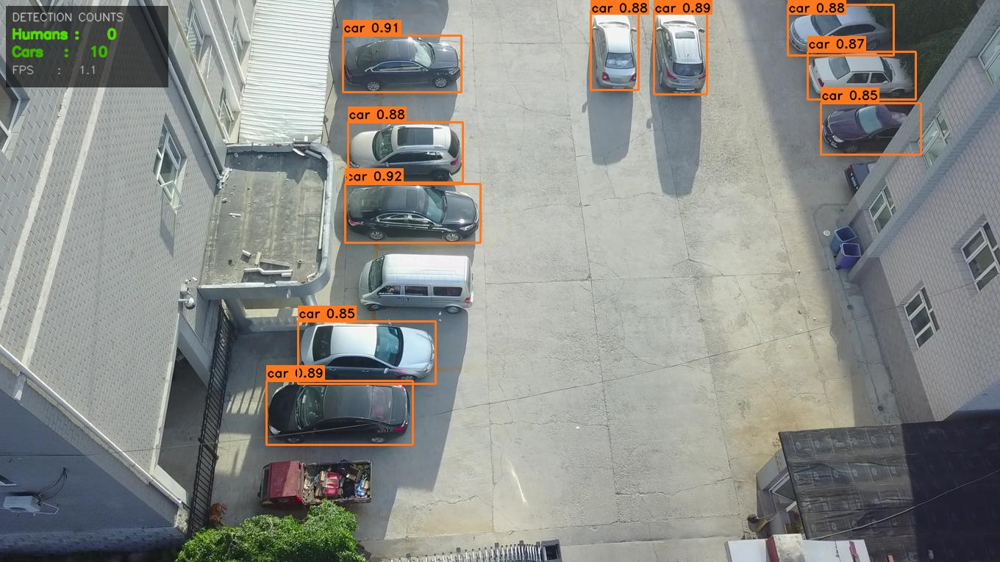

humans=11  cars=22


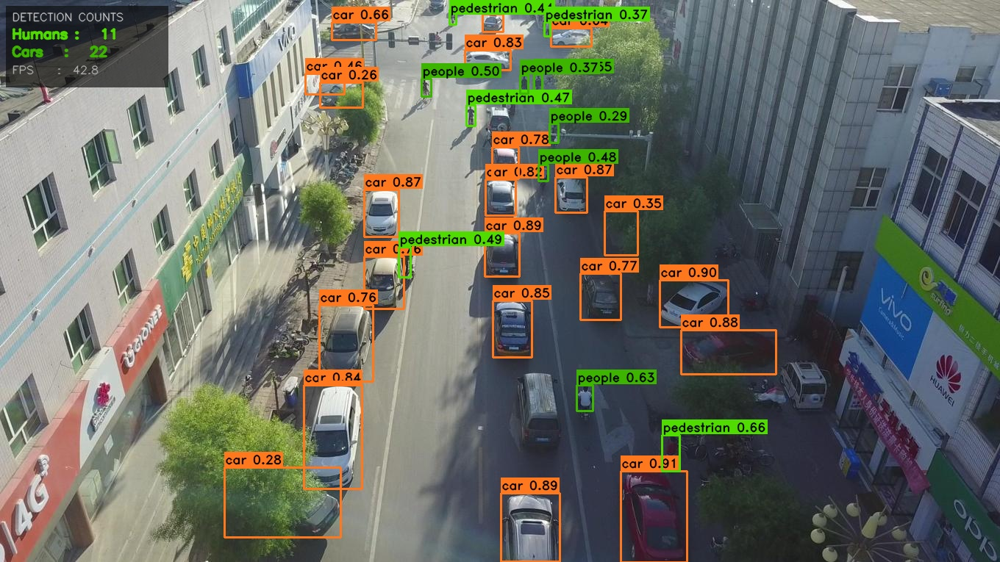

humans=22  cars=16


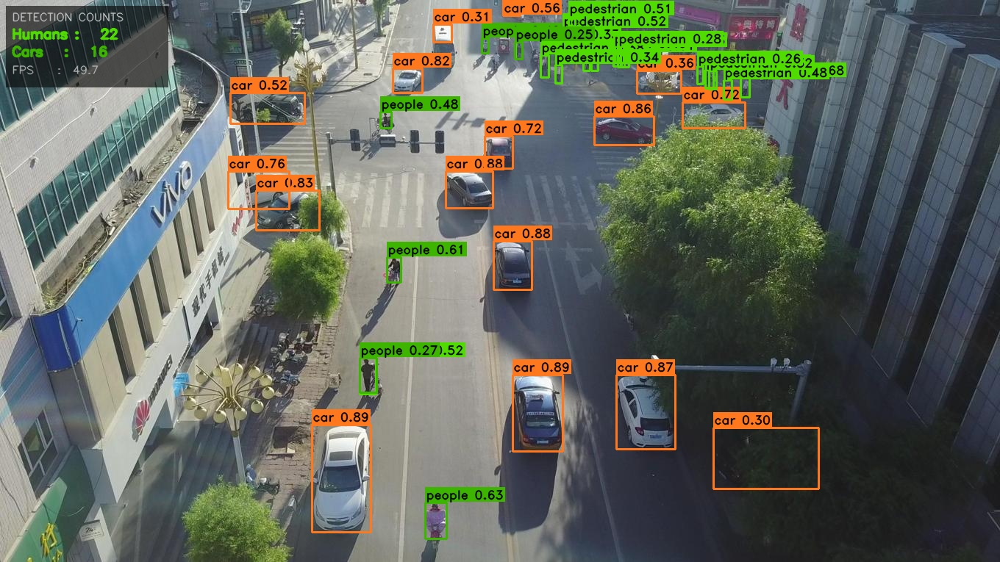

humans=21  cars=17


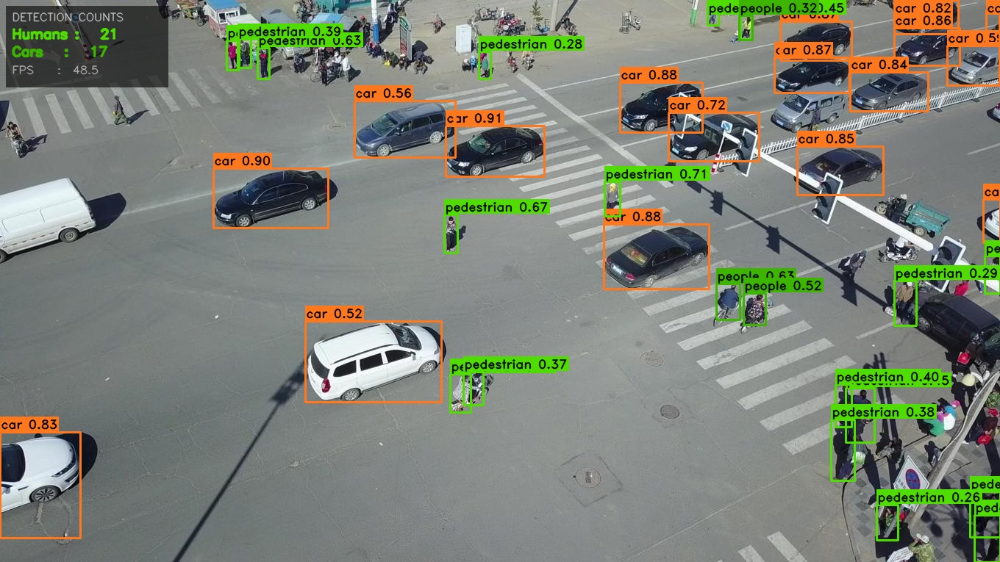

humans=7  cars=24


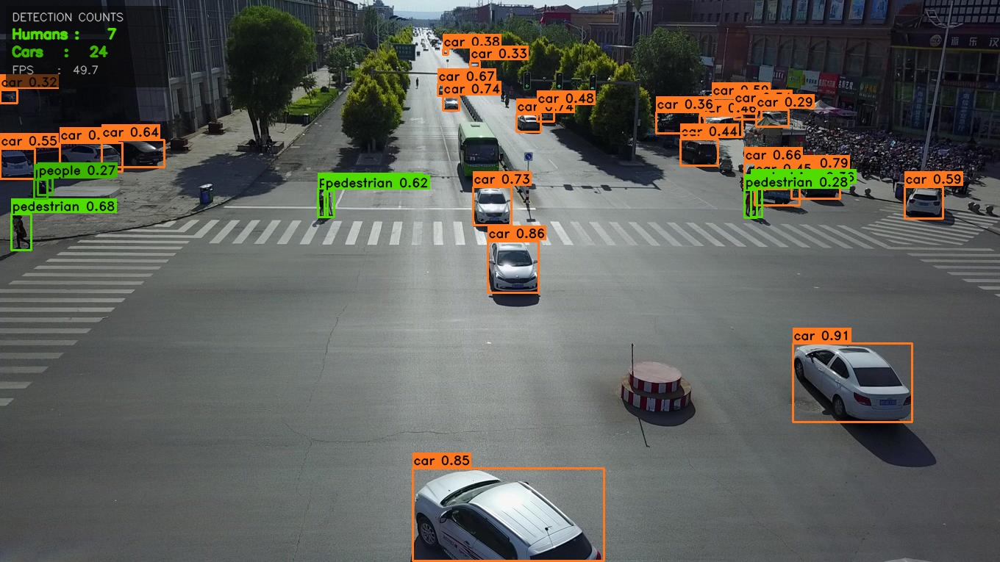

humans=27  cars=51


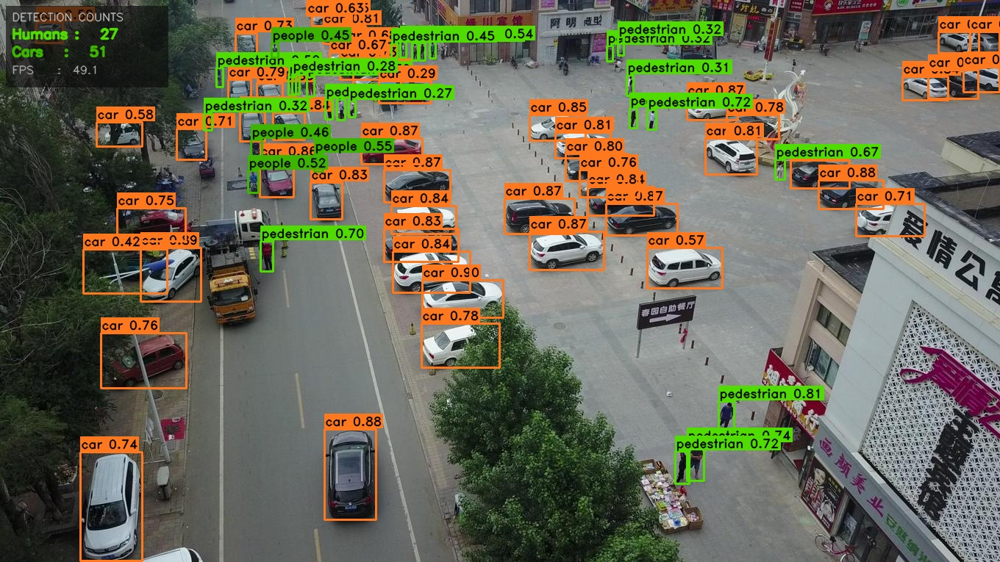

humans=26  cars=34


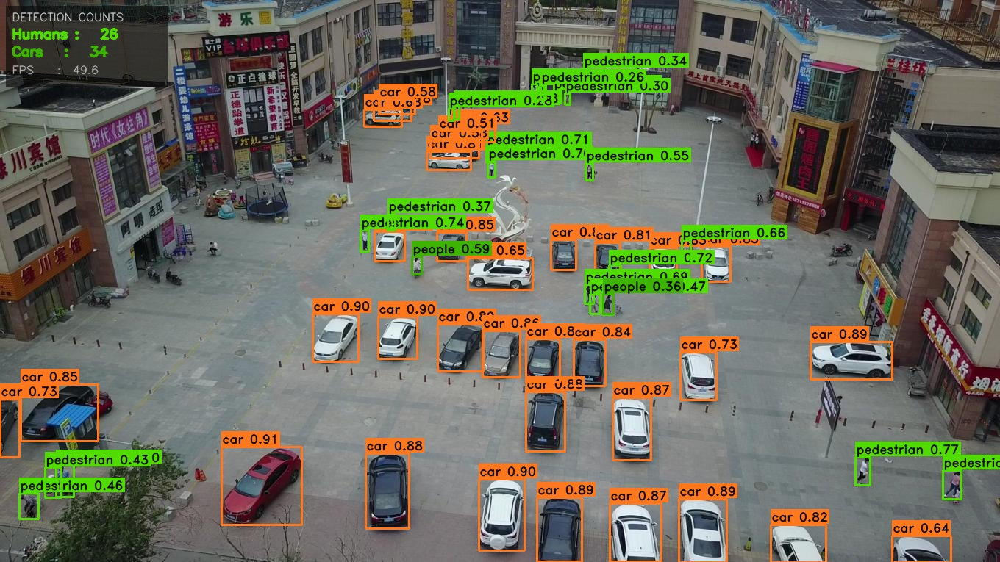

humans=4  cars=4


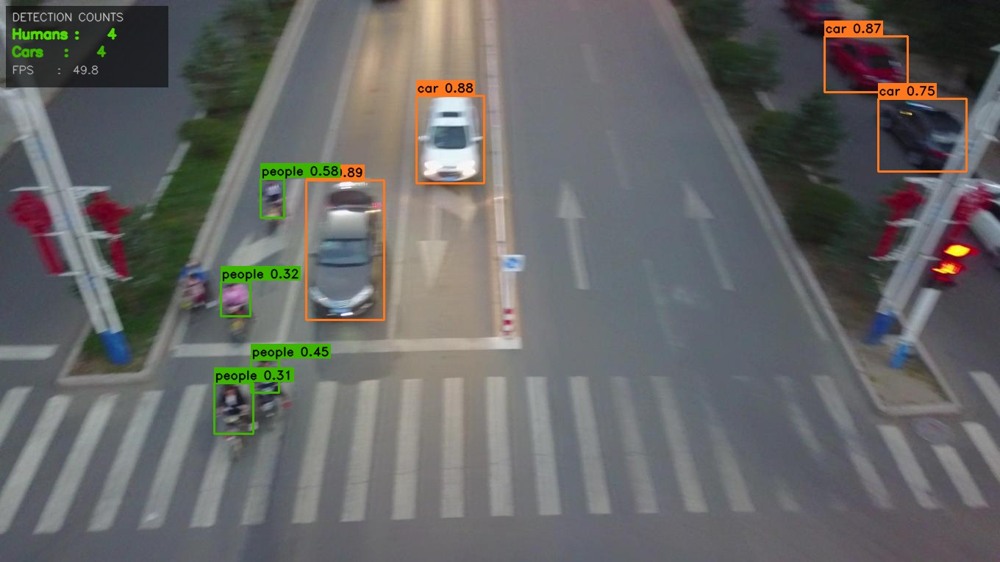

In [6]:
import sys, random
sys.path.insert(0, '/kaggle/working/src')
from detect import detect_source
from IPython.display import Image, display
from pathlib import Path

WEIGHTS  = "/kaggle/working/runs/train/visdrone_yolov8n/weights/best.pt"
VAL_DIR  = "/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val/images"
SAVE_DIR = "/kaggle/working/outputs/predictions"

# Verify weights exist before running
print("Weights exist:", Path(WEIGHTS).exists())
print("Weights size:", Path(WEIGHTS).stat().st_size / 1e6, "MB")

# Pick 8 random val images for a quick qualitative check
val_imgs = list(Path(VAL_DIR).glob("*.jpg"))
sample   = random.sample(val_imgs, min(8, len(val_imgs)))

# Create a temp dir with just those images
import os, shutil
tmp = "/kaggle/working/outputs/sample_val"
if os.path.exists(tmp):
    shutil.rmtree(tmp)
os.makedirs(tmp, exist_ok=True)
for p in sample:
    shutil.copy(p, tmp)


results = detect_source(weights=WEIGHTS, source=tmp,
                         conf=0.25, iou=0.45, save_dir=SAVE_DIR)

# Display inline
for r in results:
    print(f"humans={r['counts']['human']}  cars={r['counts']['car']}")
    display(Image(r["path"], width=700))

Task 04 — Tracking (bonus)

In [ ]:
import sys
sys.path.insert(0, '/kaggle/working/src')
from track import run_tracking

WEIGHTS  = "/kaggle/working/runs/train/visdrone_yolov8n/weights/best.pt"
# Replace with your video path — e.g. a VisDrone MOT sequence converted to mp4
VIDEO    = "/kaggle/input/your-video-dataset/sample.mp4"

track_classes, track_history = run_tracking(
    weights  = WEIGHTS,
    source   = VIDEO,
    conf     = 0.30,
    iou      = 0.45,
    save_dir = "/kaggle/working/outputs/tracking",
    max_age  = 30,
)

print(f"\nUnique human tracks : {sum(1 for cls in track_classes.values() if cls == 0)}")
print(f"Unique car tracks   : {sum(1 for cls in track_classes.values() if cls != 0)}")

Task 05 — Evaluation & visualization

  Evaluating YOLOv8 on VisDrone Validation Set
Ultralytics 8.4.51 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 265.4±89.9 MB/s, size: 153.1 KB)
val: Scanning /kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val/labels... 548 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 548/548 624.5it/s 0.9s0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 2.8it/s 12.4s0.2s
                   all        548      38759      0.225      0.168      0.154     0.0929
            pedestrian        520       8844      0.719      0.484      0.439      0.224
                people        482       5125

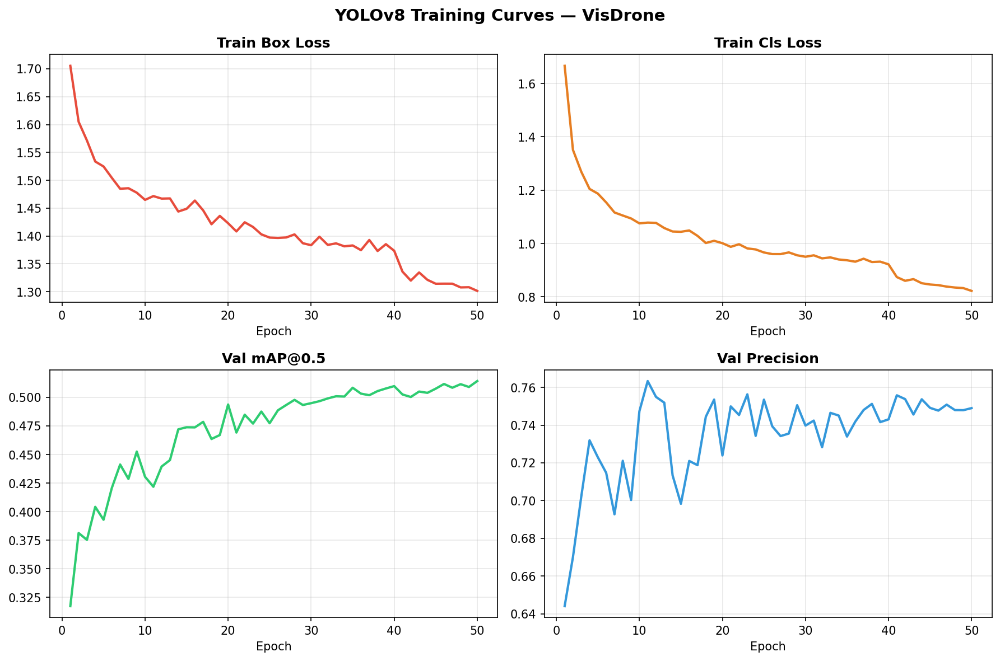


metrics_card


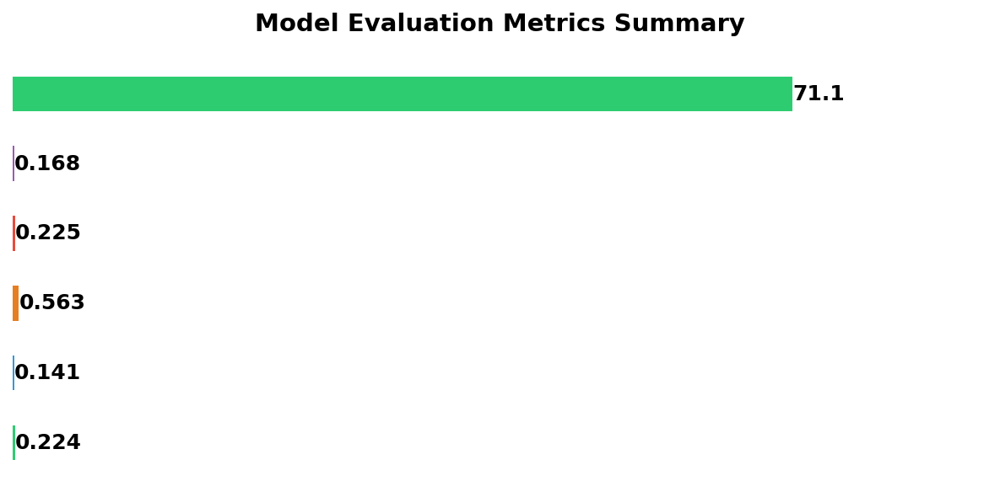


prediction_grid


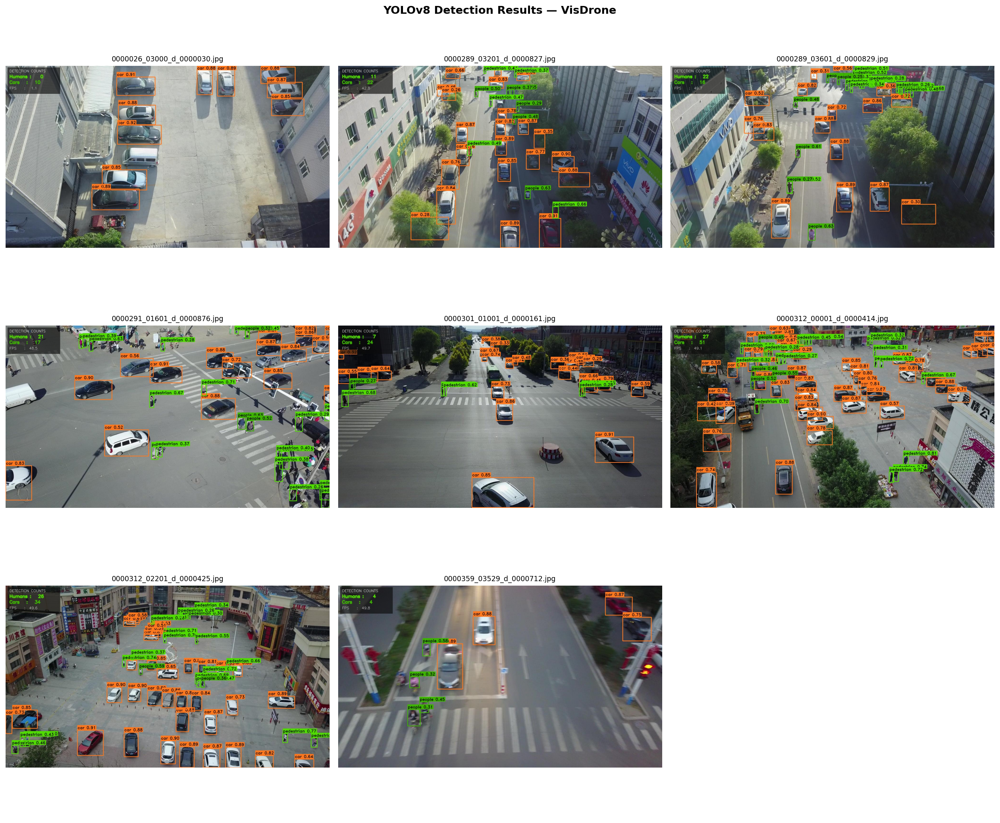

In [7]:
import sys
sys.path.insert(0, '/kaggle/working/src')
from evaluate import run_evaluation, benchmark_fps
from visualize import (generate_full_report, plot_training_curves,
                        plot_metrics_card, plot_fps_benchmark)
from pathlib import Path
from IPython.display import Image, display

WEIGHTS  = "/kaggle/working/runs/train/visdrone_yolov8n/weights/best.pt"
DATA_CFG = "/kaggle/working/configs/visdrone.yaml"
VIS_DIR  = "/kaggle/working/outputs/visualizations"

# ── mAP evaluation ────────────────────────────────────────────────────────
metrics = run_evaluation(weights=WEIGHTS, data=DATA_CFG,
                          imgsz=1280, conf=0.25, iou=0.45, device="0")

# ── Training curves ────────────────────────────────────────────────────────
csv = "/kaggle/working/runs/train/visdrone_yolov8n/results.csv"
if Path(csv).exists():
    plot_training_curves(csv, out_path=f"{VIS_DIR}/training_curves.png")
else:
    print("No results.csv found — skipping training curves")

# ── FPS benchmark on one val image ────────────────────────────────────────
import random
val_imgs = list(Path(
    "/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset"
    "/VisDrone2019-DET-val/images"
).glob("*.jpg"))
benchmark_img = str(random.choice(val_imgs))
avg_fps = benchmark_fps(WEIGHTS, benchmark_img, n_runs=50, imgsz=1280, device="0")

# ── Metrics summary card ───────────────────────────────────────────────────
# summary = {
#     "mAP50_human":  metrics.box.maps[0] if len(metrics.box.maps) > 0 else 0,
#     "mAP50_car":    metrics.box.maps[1] if len(metrics.box.maps) > 1 else 0,
#     "precision":    metrics.box.mp,
#     "recall":       metrics.box.mr,
#     "fps":          avg_fps,
# }
summary = {
    "mAP50_pedestrian": float(metrics.box.maps[0]),
    "mAP50_people":     float(metrics.box.maps[1]),
    "mAP50_car":        float(metrics.box.maps[3]),
    "precision":        metrics.box.mp,
    "recall":           metrics.box.mr,
    "fps":              avg_fps,
}
plot_metrics_card(summary, out_path=f"{VIS_DIR}/metrics_card.png")

# ── Detection result grid (from Task 03 outputs) ──────────────────────────
pred_paths = sorted(Path("/kaggle/working/outputs/predictions").glob("*.jpg"))[:9]
if pred_paths:
    from visualize import plot_prediction_grid
    plot_prediction_grid([str(p) for p in pred_paths],
                          out_path=f"{VIS_DIR}/prediction_grid.png")
else:
    print("No prediction images yet — run Task 03 first")
# ── Display all in notebook ────────────────────────────────────────────────
plots = ["training_curves", "metrics_card", "prediction_grid"]
for name in plots:
    p = f"{VIS_DIR}/{name}.png"
    if Path(p).exists():
        print(f"\n{name}")
        display(Image(p, width=800))
    else:
        print(f"{name}.png not found — skipped")

0000026_03000_d_0000030.jpg: humans=0, cars=10
0000289_03201_d_0000827.jpg: humans=0, cars=10
0000289_03601_d_0000829.jpg: humans=2, cars=6
0000291_01601_d_0000876.jpg: humans=8, cars=15
0000301_01001_d_0000161.jpg: humans=0, cars=3
0000312_00001_d_0000414.jpg: humans=7, cars=24
0000312_02201_d_0000425.jpg: humans=3, cars=19
0000359_03529_d_0000712.jpg: humans=0, cars=3
Saved: /kaggle/working/outputs/visualizations/count_summary.png


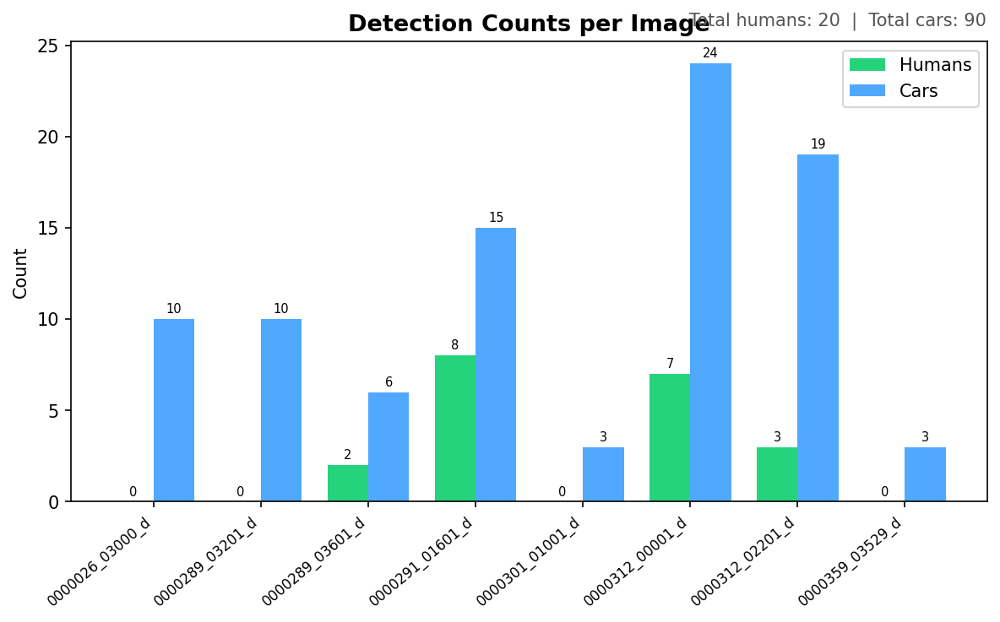

In [8]:
import sys
sys.path.insert(0, '/kaggle/working/src')
from visualize import plot_count_summary
from IPython.display import Image, display
from pathlib import Path

# Rebuild results list from saved prediction images using detect
from detect import detect_source
from ultralytics import YOLO

WEIGHTS  = "/kaggle/working/runs/train/visdrone_yolov8n/weights/best.pt"
SAVE_DIR = "/kaggle/working/outputs/predictions"
VIS_DIR  = "/kaggle/working/outputs/visualizations"

model = YOLO(WEIGHTS)
pred_imgs = sorted(Path(SAVE_DIR).glob("*.jpg"))

# Re-count from already saved prediction images
import cv2
import numpy as np

results_list = []
for img_path in pred_imgs:
    res = model.predict(str(img_path), conf=0.25, iou=0.45,
                        classes=[0,1,3], verbose=False)[0]
    human_count = sum(1 for c in res.boxes.cls.cpu().numpy().astype(int) if c in {0,1})
    car_count   = sum(1 for c in res.boxes.cls.cpu().numpy().astype(int) if c == 3)
    results_list.append({
        "path":   str(img_path),
        "counts": {"human": human_count, "car": car_count}
    })
    print(f"{img_path.name}: humans={human_count}, cars={car_count}")

plot_count_summary(results_list, out_path=f"{VIS_DIR}/count_summary.png")
display(Image(f"{VIS_DIR}/count_summary.png", width=800))